---
# Система реализации

In [30]:
from typing import List, Dict, NoReturn, Union
import logging
import os
import random
import copy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import plotly.express as px
import sidetable

from space_bandits.toy_problem import generate_dataframe
from sklearn.model_selection import train_test_split

logging.basicConfig(format="%(asctime)s - [%(levelname)s] -  %(funcName)s - %(message)s",
                    datefmt="%d/%m/%Y %H:%M:%S",
                    level=logging.INFO)
logger = logging.getLogger('MAIN')

In [31]:
SEED = 42

def seed_torch(seed: int) -> NoReturn:
    
    """
    Функция, которая фиксирует случайность для дальнейшего воспроизведения кода
    params:
        seed: значение зерна фиксации
    """
    
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)

seed_torch(SEED)

In [32]:
from space_bandits.toy_problem import get_customer_nl, get_rewards_nl, get_cust_reward_nl

get_customer = get_customer_nl
get_rewards = get_rewards_nl
get_cust_reward = get_cust_reward_nl

n = 50_000

In [33]:
age = list()
ARPU = list()
best_action = list()
rewards = list()

for i in range(n):
    cust = get_customer()
    reward = get_rewards(cust)
    age.append(cust[1][0])
    ARPU.append(cust[1][1])
    best_action.append(cust[0])
    rewards.append(get_rewards(cust))
    
df = pd.DataFrame({'age':age,'ARPU':ARPU,'best_action':best_action,'rewards':rewards})
print(df.shape)
df.head()

(50000, 4)


,age,ARPU,best_action,rewards
0,48,26.667467,2,"[0, 0, 0]"
1,49,34.867623,2,"[0, 0, 0]"
2,24,123.926383,0,"[10, 0, 0]"
3,33,121.834956,0,"[10, 0, 0]"
4,23,126.619225,0,"[0, 0, 0]"


In [34]:
context = ['age','ARPU']
action_name = 'best_action'
reward_name = 'rewards'

In [35]:
from space_bandits import LinearBandits

In [36]:
num_actions = df[action_name].nunique()
num_features = len(context)
linearb_model = LinearBandits(num_actions=num_actions, 
                              num_features=num_features, 
                              initial_pulls=100)

In [37]:
train, valid = train_test_split(df, test_size=0.4, random_state=SEED)
train.reset_index(drop=True, inplace=True)
valid.reset_index(drop=True, inplace=True)
print(train.shape, valid.shape)

(30000, 4) (20000, 4)


In [38]:
def plotting(history: Dict, name: str='reward'):
    if name == 'reward':
        fig = px.line(history['cumulative_reward_list'], labels={"value": "Reward",
                                                           "index": 'Views'})
        fig.update_layout(title_text=f"""Кумулятивный reward""" ,showlegend=True)
    else:
        fig = px.line(history['cumulative_regret_list'], labels={"value": "Regret",
                                                           "index": 'Views'})
        fig.update_layout(title_text=f"""Кумулятивный regret""" ,showlegend=True)
    fig.show()

In [39]:
class MBanditsSystem:
    def __init__(self, action_name: str, reward_name: str, coef: float):
        
        '''
        Класс UcbBanditsSystem системы обучения по батчам и дообучения
            action_name: столбец действия/ руки
            reward_name: столбец награды/ ответа
            coef: параметр исследования
        '''
        
        self.action_name = action_name
        self.reward_name = reward_name
        self.coef = coef
        
        self.cnt = 0
        
    def train(self, df: pd.DataFrame, random: bool=False, reset: bool=False):
        
        '''
        Функция обучения
            df: датафрейм с контекстом, действиями и наградой
            random: параметр модели случайная / UCB
        '''
        history = {'cumulative_reward_list': list(),
                   'cumulative_regret_list': list()}
        
        # общее вознаграждение и упущенная возможность
        self.cumulative_reward, self.total_regret = 0, 0
        
        n_arms = df[self.action_name].nunique()
        arm_indices = np.array(range(n_arms))
        
        # среднее вознаграждение за каждую руку
        self.Q = np.zeros(n_arms)
        # критерий неопределенности UCB
        self.uncertainty = np.zeros(n_arms)
        # количество шагов для каждой руки
        self.N = np.zeros(n_arms)
        
        if reset:
            self.cnt = 0
        
        # итерируемся по обчающему множеству
        for indx, row in tqdm(df.iterrows()):
            
            if random:
                arm = np.random.choice(arm_indices)
            else:
                # выбор руки
                if any(self.N==0):
                    arm = np.random.choice(arm_indices[self.N==0])
                else:
                    uncertainty = np.sqrt(np.log(self.cnt) / self.N)
                    arm = np.argmax(self.Q +  self.coef * self.uncertainty)

            self.cnt += 1
            
            #### Надо задать конверсии (мб через бернулливскую величину)
            # ЭКСПЕРИМЕНТ№1: 2%,4%,6% конверсии, награды одинаковы
            # ЭКСПЕРИМЕНТ№2: 2%,4%,6% конверсии, награды 6,4,2
            # ЭКСПЕРИМЕНТ№3: 2%,4%,6% конверсии, поменялись награды в середине (сначала одинаковы, потом 6,4,2)
            
            
            ### НУЖНО ПОКУМЕКАТЬ... (что если у нас нет никакой информации о том какая рука оптимальная и какая награда для каждой из рук...)
            reward = row[self.reward_name][arm]
        
            mx = row[self.reward_name][row[self.action_name]]
            
            self.N[arm] += 1
            self.Q[arm] += (1 / self.N[arm]) * (reward - self.Q[arm])
            
            
            # считаем вознаграждение, упущенную возможность и добавляем к накопительным спискам
            regret = mx - reward
            self.total_regret += regret
            history['cumulative_regret_list'].append(self.total_regret)
            self.cumulative_reward += reward
            history['cumulative_reward_list'].append(self.cumulative_reward)
        
        if random:
            self.bandit = None
        else:
            self.bandit = {'Q':self.Q,'uncertainty':self.uncertainty,'N':self.N}
                    
        return self.bandit, history
    
    def fine_train(self, pre_train_bandit, df: pd.DataFrame):
        
        '''
        Функция дообучения
            df: датафрейм с контекстом, действиями и наградой
        '''
        history_fine = {'cumulative_reward_list': list(),
                        'cumulative_regret_list': list()}
        
        cumulative_reward, total_regret = self.cumulative_reward, self.total_regret
        
        bandit = copy.deepcopy(pre_train_bandit)
        
        n_arms = df[self.action_name].nunique()
        arm_indices = np.array(range(n_arms))
        
        fine_cnt = self.cnt
        
        if bandit is None:
            logger.error('Дообучение доступно только для UCB алгоритма!')
            return None, None
        
        else:

            for indx_update, row_update in df.iterrows():

                # выбор руки
                if any(bandit['N']==0):
                    arm = np.random.choice(arm_indices[bandit['N']==0])
                else:
                    bandit['uncertainty'] = np.sqrt(np.log(fine_cnt) / bandit['N'])
                    arm = np.argmax(bandit['Q'] +  self.coef * bandit['uncertainty'])
            
                fine_cnt += 1
                
                reward = row_update[self.reward_name][arm]

                mx = row_update[self.reward_name][row_update[self.action_name]]

                bandit['N'][arm] += 1
                bandit['Q'][arm] += (1 / bandit['N'][arm]) * (reward - bandit['Q'][arm])

                # считаем вознаграждение, упущенную возможность и добавляем к накопительным спискам
                regret = mx - reward
                total_regret += regret
                history_fine['cumulative_regret_list'].append(total_regret)
                cumulative_reward += reward
                history_fine['cumulative_reward_list'].append(cumulative_reward)
        
            logger.info(f'Было дообучено {fine_cnt-self.cnt} клиентов к {self.cnt}, итого UCB алгоритм обучен на {fine_cnt} клиентах!')
            
            return bandit, history_fine    

In [40]:
mabmodel = MBanditsSystem(action_name=action_name,
                          reward_name=reward_name,
                          coef=10)

In [41]:
random_bandit_model, random_history = mabmodel.train(df=train, random=True, reset=True)
random_bandit_model

30000it [00:03, 7725.78it/s]


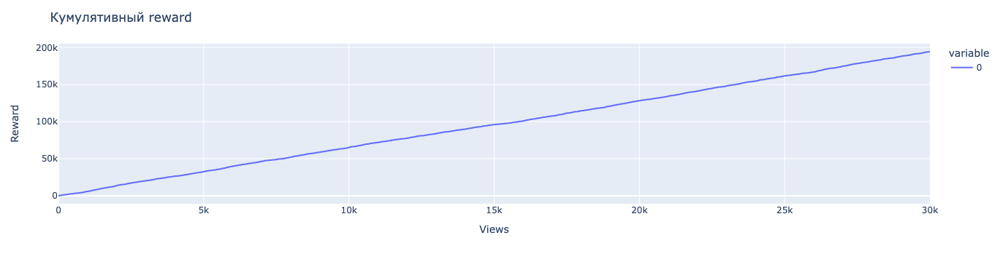

In [42]:
plotting(random_history, 'reward')

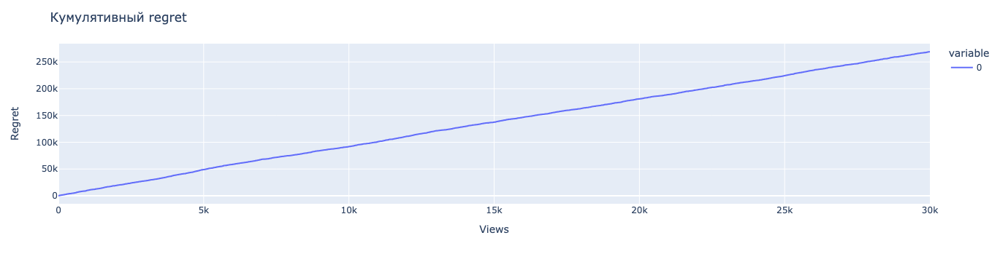

In [43]:
plotting(random_history, 'regret')

---
# UCB

In [44]:
ucb_bandit_model, ucb_history = mabmodel.train(df=train, reset=True)

30000it [00:05, 5927.52it/s]


In [45]:
ucb_bandit_model

{'Q': array([3.66857791, 0.        , 0.        ]),
 'uncertainty': array([0., 0., 0.]),
 'N': array([2.9998e+04, 1.0000e+00, 1.0000e+00])}

In [46]:
mabmodel.cnt

30000

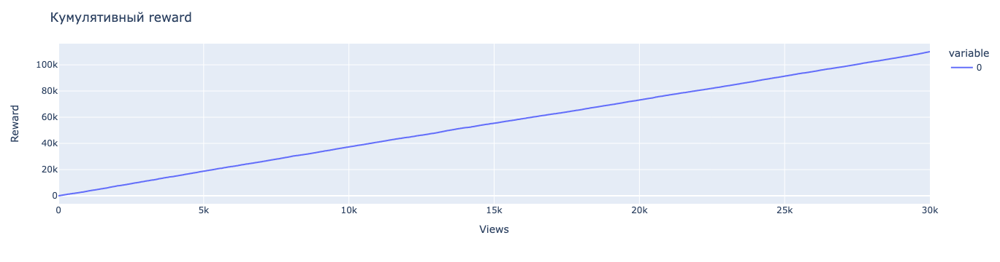

In [47]:
plotting(ucb_history, 'reward')

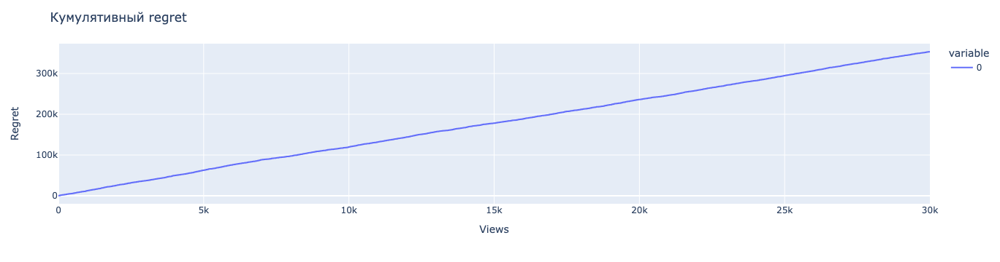

In [48]:
plotting(ucb_history, 'regret')

In [49]:
width = 0.45
bins = np.linspace(0, num_actions-1, num_actions) - width/2

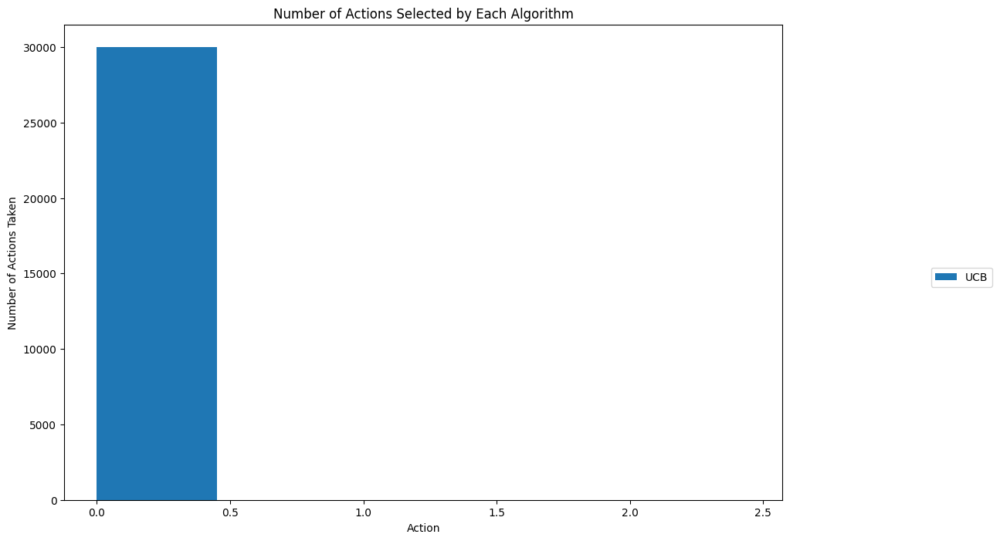

In [50]:
plt.figure(figsize=(12,8))
plt.bar(bins+0.45, ucb_bandit_model['N'],
        width=width, 
        label="UCB")
plt.legend(bbox_to_anchor=(1.3, 0.5))
plt.title("Number of Actions Selected by Each Algorithm")
plt.xlabel("Action")
plt.ylabel("Number of Actions Taken")
plt.show()

In [51]:
ucb_bandit_fine_model, ucb_fine_history = mabmodel.fine_train(df=valid, pre_train_bandit=ucb_bandit_model)

09/08/2024 16:24:56 - [INFO] -  fine_train - Было дообучено 20000 клиентов к 30000, итого UCB алгоритм обучен на 50000 клиентах!


In [52]:
ucb_bandit_fine_model

{'Q': array([ 3.66857791,  5.11363636, 10.58222267]),
 'uncertainty': array([0.01899165, 0.49588668, 0.02328419]),
 'N': array([29998.,    44., 19958.])}

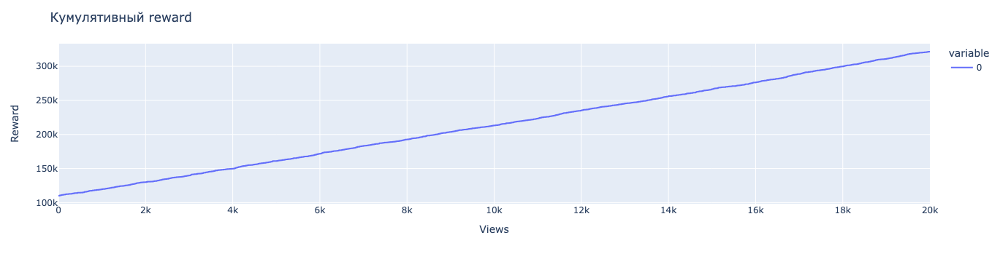

In [53]:
plotting(ucb_fine_history, 'reward')

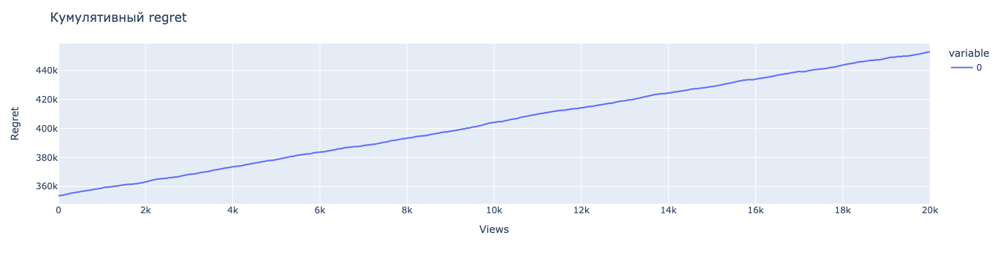

In [54]:
plotting(ucb_fine_history, 'regret')

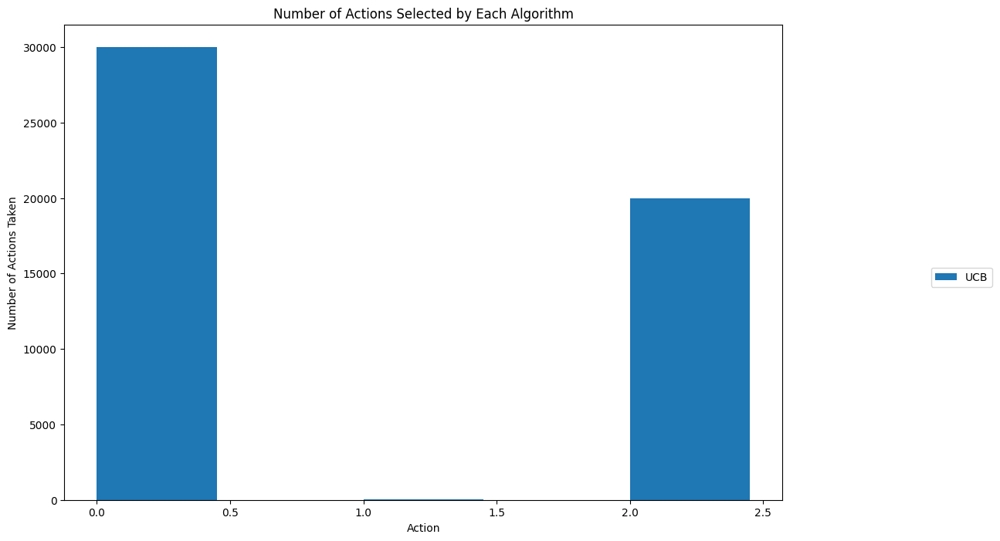

In [55]:
plt.figure(figsize=(12,8))
plt.bar(bins+0.45, ucb_bandit_fine_model['N'],
        width=width, 
        label="UCB")
plt.legend(bbox_to_anchor=(1.3, 0.5))
plt.title("Number of Actions Selected by Each Algorithm")
plt.xlabel("Action")
plt.ylabel("Number of Actions Taken")
plt.show()

In [56]:
from collections import Counter

class LinearBanditsSystem:
    def __init__(self, bandit_model, context_list: List, action_name: str, reward_name: str):
        
        '''
        Класс LinearBanditsSystem системы обучения по батчам и дообучения
            bandit_model: объект бандита из Space Bandits
            context_list: список фичей для контекста
            action_name: столбец действия/ руки
            reward_name: столбец награды/ ответа
        '''
        
        self.bandit = bandit_model
        self.context_list = context_list
        self.action_name = action_name
        self.reward_name = reward_name
        
        self.num_actions = bandit_model.hparams['num_actions']
        self.cnt = 0
        
    def train(self, df: pd.DataFrame, first_batch_size: int, retrain: bool = False):
        
        '''
        Функция обучения
            df: датафрейм с контекстом, действиями и наградой
            first_batch_size: размер батча обучения
        '''
        history = {'cumulative_reward_list': list(),
                   'cumulative_regret_list': list()}
        
        X, y, a = list(), list(), list()
        
        # общее вознаграждение и упущенная возможность
        self.cumulative_reward, self.total_regret = 0, 0
        
        # итерируемся по обчающему множеству
        for indx, row in tqdm(df.iterrows()):
            
            # достаем контекст по клиенту
            context = np.array([row[self.context_list]])
            
            # условие накопления данных, установлен размер first_batch_size
            if (self.cnt+1) < first_batch_size:
                # пока не накопили данные - дергаем ручку случайно из array действий
                arm = np.random.choice(np.array(range(self.num_actions)))
            else:
                # как только накопили случайные действия, начинаем принимать решения относительно знаний бандита
                arm = self.bandit.action(context)
            self.cnt += 1
            
            # если действие не равно оптимальному - получаем нулевое вознаграждение, в остальных случаях берем наилучшее вознаграждение
            
            reward = float(row[self.reward_name][arm])

            mx = row[self.reward_name][row[self.action_name]]
            
            # добавляем к выборке всех проверенных клиентов
            X.append(context.tolist()[0])
            y.append(reward)
            a.append(arm)
            
            # считаем вознаграждение, упущенную возможность и добавляем к накопительным спискам
            regret = mx - reward
            self.total_regret += regret
            history['cumulative_regret_list'].append(self.total_regret)
            self.cumulative_reward += reward
            history['cumulative_reward_list'].append(self.cumulative_reward)
            
            # как только изучили first_batch_size клиентов, обновляем и обучаем бандита
            if self.cnt % first_batch_size == 0:
                logger.info(msg=f'Обновление модели на подвыборке {self.cnt}')
                train_df = pd.DataFrame(X,
                                        columns=self.context_list)
                train_df[self.reward_name] = y
                train_df[self.action_name] = a
                logger.info(msg=f'Распределение ручек: \n{train_df[self.action_name].value_counts()}')
                logger.info(msg=f'Текущий regret: {history["cumulative_regret_list"][-1]}')

                for indx_update, row_update in train_df.iterrows():
                    context = np.array([row_update[self.context_list]])
                    action = int(row_update[self.action_name])
                    reward = float(row_update[self.reward_name])
                    self.bandit.update(context, action, reward)
                    
                if retrain:
                    X, y, a = list(), list(), list()
                    
        return self.bandit, history
                    
    def fine_train(self, pre_train_bandit, df: pd.DataFrame):
        
        '''
        Функция дообучения
            df: датафрейм с контекстом, действиями и наградой
        '''
        history_fine = {'cumulative_reward_list': list(),
                        'cumulative_regret_list': list()}
        
        a = list()
        
        cumulative_reward, total_regret = self.cumulative_reward, self.total_regret
        
        bandit = copy.deepcopy(pre_train_bandit)

        for indx_update, row_update in tqdm(df.iterrows()):
            
            context = np.array([row_update[self.context_list]])
            action = int(row_update[self.action_name])
            
            arm = bandit.action(context)
            reward = float(row_update[self.reward_name][arm])
            bandit.update(context, action, reward)
            
            a.append(arm)
            
            mx = row_update[self.reward_name][row_update[self.action_name]]
            
            # считаем вознаграждение, упущенную возможность и добавляем к накопительным спискам
            regret = mx - reward
            total_regret += regret
            history_fine['cumulative_regret_list'].append(total_regret)
            cumulative_reward += reward
            history_fine['cumulative_reward_list'].append(cumulative_reward)
        logger.info(msg=f'Распределение ручек после дообучения: \n{Counter(a)}')
        
        return bandit, history_fine

In [57]:
model = LinearBanditsSystem(bandit_model=linearb_model,
                            context_list=context,
                            action_name=action_name,
                            reward_name=reward_name
                           )

In [58]:
base_bandit_model, train_history = model.train(df=train,
                                               first_batch_size=5_000,
                                               retrain=True
                                              )

4850it [00:04, 1511.06it/s]09/08/2024 16:25:01 - [INFO] -  train - Обновление модели на подвыборке 5000
09/08/2024 16:25:01 - [INFO] -  train - Распределение ручек: 
1    1760
2    1625
0    1615
Name: best_action, dtype: int64
09/08/2024 16:25:01 - [INFO] -  train - Текущий regret: 47275.0
9949it [00:15, 773.17it/s] 09/08/2024 16:25:12 - [INFO] -  train - Обновление модели на подвыборке 10000
09/08/2024 16:25:12 - [INFO] -  train - Распределение ручек: 
2    3325
0    1610
1      65
Name: best_action, dtype: int64
09/08/2024 16:25:12 - [INFO] -  train - Текущий regret: 58975.0
14986it [00:30, 837.50it/s]09/08/2024 16:25:27 - [INFO] -  train - Обновление модели на подвыборке 15000
09/08/2024 16:25:27 - [INFO] -  train - Распределение ручек: 
2    3345
0    1651
1       4
Name: best_action, dtype: int64
09/08/2024 16:25:27 - [INFO] -  train - Текущий regret: 72550.0
19938it [00:48, 841.53it/s]09/08/2024 16:25:45 - [INFO] -  train - Обновление модели на подвыборке 20000
09/08/2024 16:25:

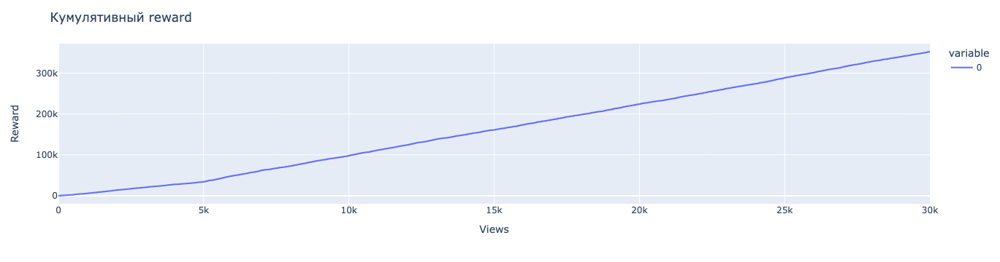

In [59]:
plotting(train_history, 'reward')

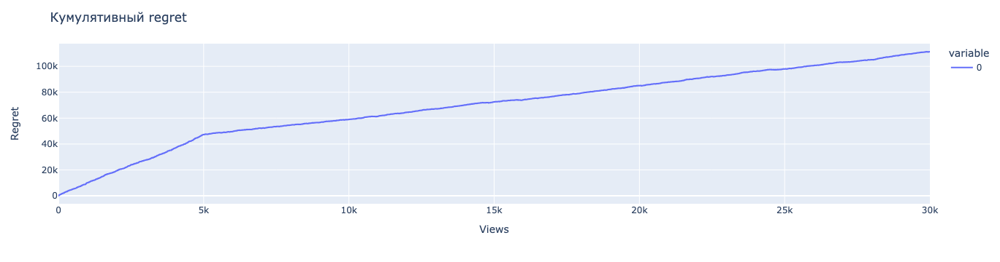

In [60]:
plotting(train_history, 'regret')

---
# Модель обучена
### Применим на валидационной выборке
* Отдаем выборку с действиями заказчику

In [61]:
from sklearn.metrics import classification_report

In [62]:
valid, control = train_test_split(valid, test_size=0.5)
valid.reset_index(drop=True, inplace=True)
control.reset_index(drop=True, inplace=True)
print(valid.shape, control.shape)

(10000, 4) (10000, 4)


In [63]:
model.context_list

['age', 'ARPU']

In [64]:
valid[model.context_list].head()

,age,ARPU
0,20,122.257733
1,35,81.152821
2,36,75.381122
3,38,74.259572
4,45,26.155203


In [65]:
valid_to_bussines = valid.copy()
valid_to_bussines.head()

,age,ARPU,best_action,rewards
0,20,122.257733,0,"[10, 0, 0]"
1,35,81.152821,1,"[0, 0, 0]"
2,36,75.381122,1,"[0, 0, 0]"
3,38,74.259572,1,"[0, 25, 0]"
4,45,26.155203,2,"[0, 0, 0]"


In [66]:
valid_to_bussines = valid.copy()
for a, vals in enumerate(base_bandit_model.expected_values(valid_to_bussines[model.context_list])):
    valid_to_bussines[f'm0_action_{a}'] = vals
valid_to_bussines['best_action_m0'] = valid_to_bussines[[f'm0_action_{a}' for a in range(num_actions)]].idxmax(axis=1)  
valid_to_bussines['best_action_m0'] = valid_to_bussines['best_action_m0'].apply(lambda x: int(x[-1]))
valid_to_bussines.head()

,age,ARPU,best_action,rewards,m0_action_0,m0_action_1,m0_action_2,best_action_m0
0,20,122.257733,0,"[10, 0, 0]",8.821935,6.690277,-10.158319,0
1,35,81.152821,1,"[0, 0, 0]",4.655810,5.587580,5.938328,2
2,36,75.381122,1,"[0, 0, 0]",4.078961,5.602058,7.888158,2
3,38,74.259572,1,"[0, 25, 0]",3.953593,5.328500,8.773656,2
4,45,26.155203,2,"[0, 0, 0]",-0.844359,5.653432,24.650146,2


In [67]:
valid_to_bussines[['best_action','best_action_m0']].corr()

,best_action,best_action_m0
best_action,1.000000,0.861792
best_action_m0,0.861792,1.000000


In [68]:
print(classification_report(valid_to_bussines.best_action,valid_to_bussines.best_action_m0))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3362
           1       0.85      0.06      0.11      3308
           2       0.51      0.99      0.67      3330

    accuracy                           0.68     10000
   macro avg       0.79      0.68      0.59     10000
weighted avg       0.79      0.68      0.60     10000



---
# Полчили ответы от заказчика 
### Применим на контрольной выборке
* Отдаем новую выборку с действиями заказчику

In [69]:
fine_bandit_model, fine_train_history = model.fine_train(pre_train_bandit=base_bandit_model, df=valid)

10000it [01:03, 156.43it/s]
09/08/2024 16:33:20 - [INFO] -  fine_train - Распределение ручек после дообучения: 
Counter({2: 6440, 0: 3376, 1: 184})


In [70]:
for a, vals in enumerate(fine_bandit_model.expected_values(valid_to_bussines[model.context_list])):
    valid_to_bussines[f'm1_action_{a}'] = vals
valid_to_bussines['best_action_m1'] = valid_to_bussines[[f'm1_action_{a}' for a in range(num_actions)]].idxmax(axis=1)  
valid_to_bussines['best_action_m1'] = valid_to_bussines['best_action_m1'].apply(lambda x: int(x[-1]))
valid_to_bussines.head()

,age,ARPU,best_action,rewards,m0_action_0,m0_action_1,m0_action_2,best_action_m0,m1_action_0,m1_action_1,m1_action_2,best_action_m1
0,20,122.257733,0,"[10, 0, 0]",8.821935,6.690277,-10.158319,0,8.841479,6.700466,-9.973496,0
1,35,81.152821,1,"[0, 0, 0]",4.655810,5.587580,5.938328,2,4.719807,5.590923,6.203610,2
2,36,75.381122,1,"[0, 0, 0]",4.078961,5.602058,7.888158,2,4.147093,5.589291,8.163300,2
3,38,74.259572,1,"[0, 25, 0]",3.953593,5.328500,8.773656,2,4.025967,5.337331,9.053061,2
4,45,26.155203,2,"[0, 0, 0]",-0.844359,5.653432,24.650146,2,-0.740060,5.509713,25.009991,2


In [71]:
valid_to_bussines.best_action.value_counts()

0    3362
2    3330
1    3308
Name: best_action, dtype: int64

In [72]:
valid_to_bussines.best_action_m0.value_counts()

2    6402
0    3376
1     222
Name: best_action_m0, dtype: int64

In [73]:
valid_to_bussines.best_action_m1.value_counts()

2    6499
0    3376
1     125
Name: best_action_m1, dtype: int64

In [74]:
valid_to_bussines[['best_action','best_action_m0','best_action_m1']].corr()

,best_action,best_action_m0,best_action_m1
best_action,1.000000,0.861792,0.860670
best_action_m0,0.861792,1.000000,0.994594
best_action_m1,0.860670,0.994594,1.000000


In [75]:
print(classification_report(valid_to_bussines.best_action,valid_to_bussines.best_action_m1))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3362
           1       0.78      0.03      0.06      3308
           2       0.51      0.99      0.67      3330

    accuracy                           0.67     10000
   macro avg       0.76      0.67      0.57     10000
weighted avg       0.76      0.67      0.58     10000



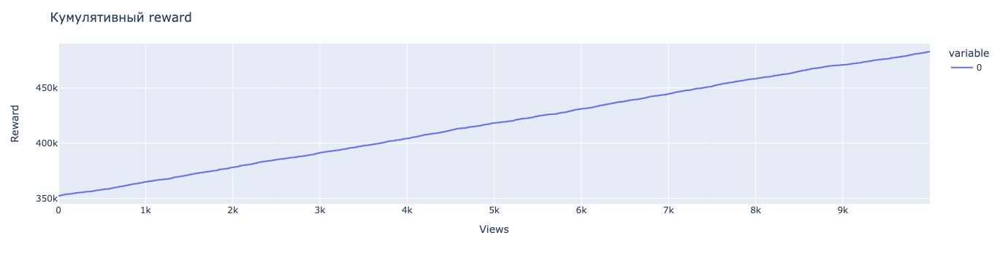

In [76]:
plotting(fine_train_history, 'reward')

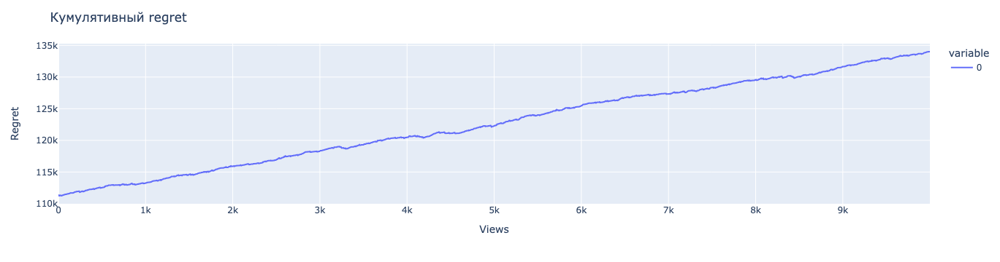

In [77]:
plotting(fine_train_history, 'regret')